In [1]:
import os
import numpy as np
import pandas as pd
import librosa

dataset_path = 'audioDataset'

classes = []
amplitudes = []
durations = []

for class_folder in os.listdir(dataset_path):
    if os.path.isdir(os.path.join(dataset_path, class_folder)):
        for file in os.listdir(os.path.join(dataset_path, class_folder)):
            if file.endswith('.wav'):
                # Load the audio file
                audio_path = os.path.join(dataset_path, class_folder, file)
                audio, sr = librosa.load(audio_path, sr=16000)

                if audio.size > 0:
                    duration = librosa.get_duration(y=audio, sr=sr)

                    amplitude_stats = [
                        np.mean(audio), 
                        np.median(audio), 
                        np.min(audio), 
                        np.max(audio), 
                        np.std(audio)
                    ]
                else:
                    
                    duration = 0.0
                    amplitude_stats = [0.0, 0.0, 0.0, 0.0, 0.0]  

                classes.append(class_folder)
                amplitudes.append(amplitude_stats)
                durations.append(duration)


audio_df = pd.DataFrame(amplitudes, columns=['Mean', 'Median', 'Min', 'Max', 'StdDev'])
audio_df['Class'] = classes
audio_df['Duration'] = durations


summary = audio_df.groupby('Class').agg(['mean', 'median', 'min', 'max', 'std', 'count'])


print(summary)


                        Mean                                              \
                        mean        median       min       max       std   
Class                                                                      
_background_noise_ -0.004955 -1.775734e-05 -0.029636 -0.000007  0.012091   
backward            0.000144 -2.651215e-07 -0.077356  0.088151  0.004145   
bed                 0.000097 -2.174734e-07 -0.077014  0.088236  0.006772   
bird               -0.000143  3.795624e-07 -0.230286  0.088332  0.010779   
cat                -0.000265 -2.574921e-07 -0.211095  0.087865  0.011951   
dog                -0.000425 -1.331314e-07 -0.230329  0.088878  0.012447   
down                0.000050 -3.643036e-07 -0.208074  0.088093  0.006024   
eight              -0.000052 -3.471374e-07 -0.208647  0.331275  0.008099   
five               -0.000010  2.784729e-07 -0.230202  0.088356  0.007253   
follow             -0.000194  2.185822e-06 -0.157871  0.017067  0.005703   
forward     

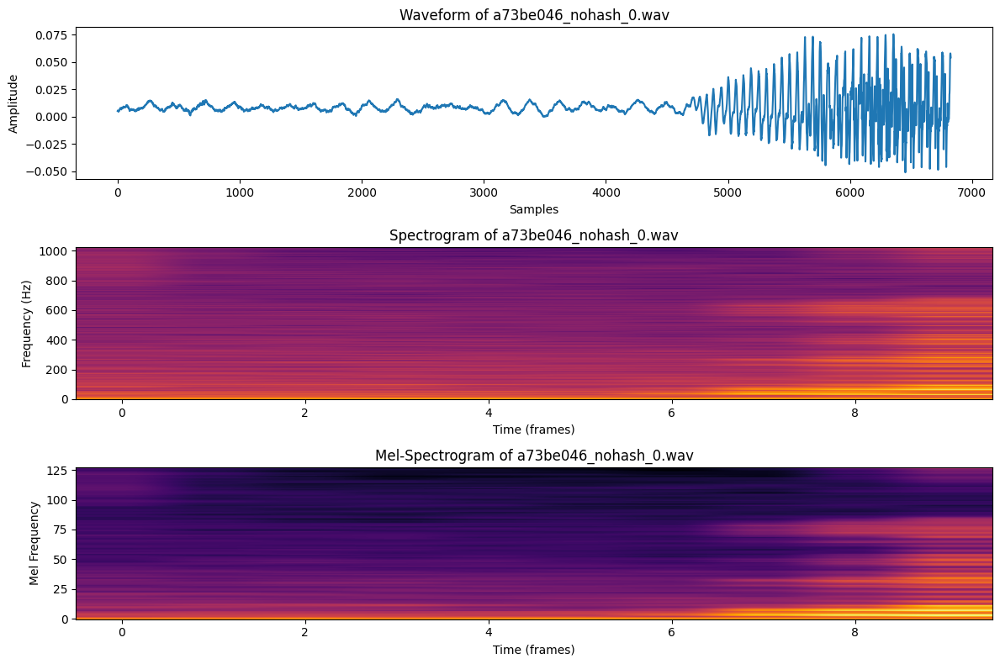

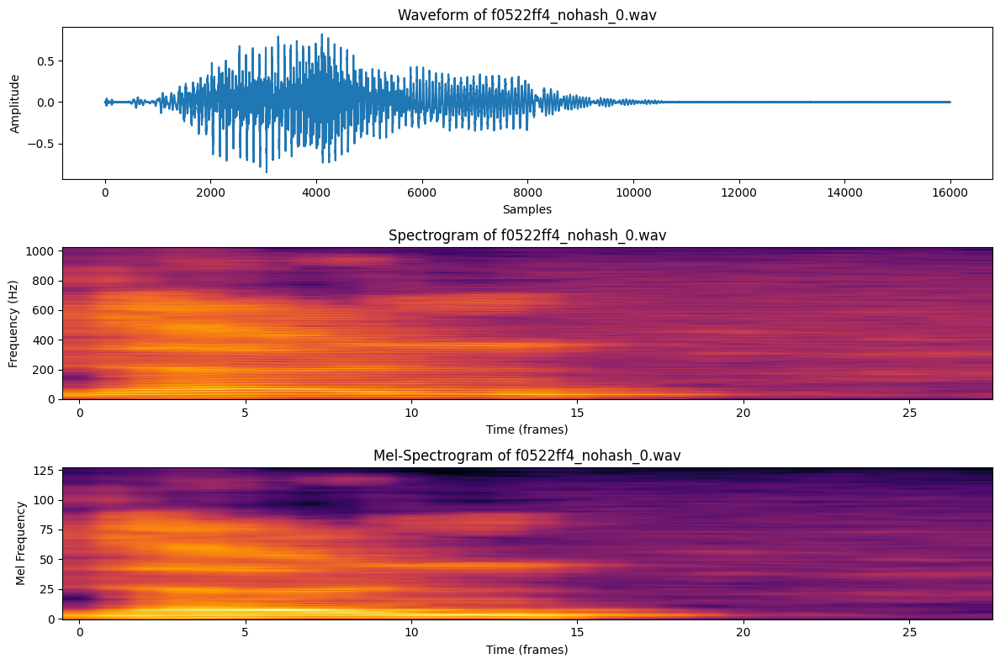

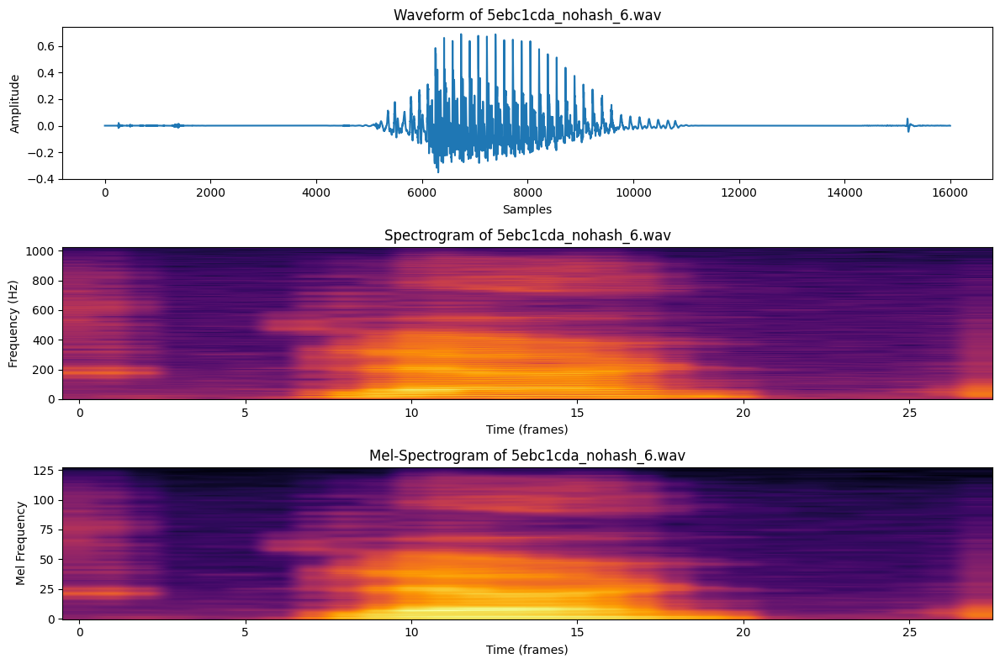

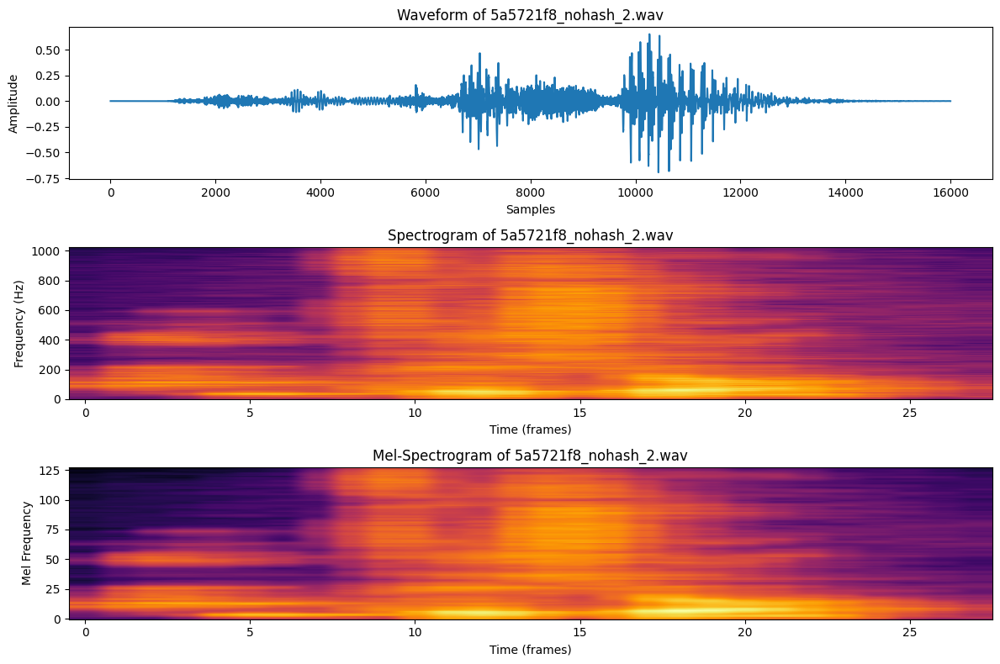

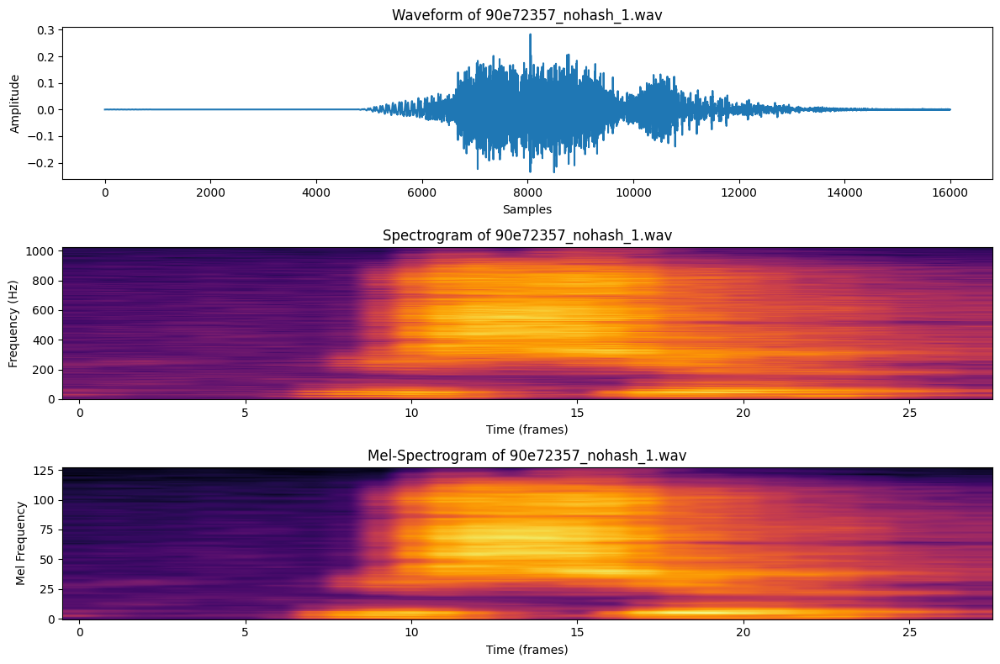

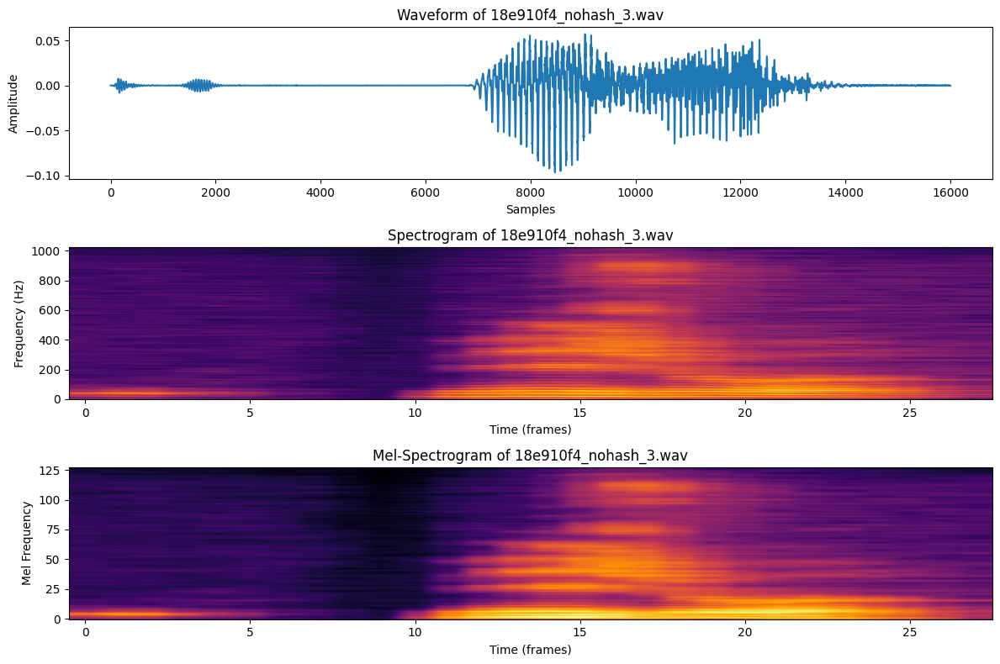

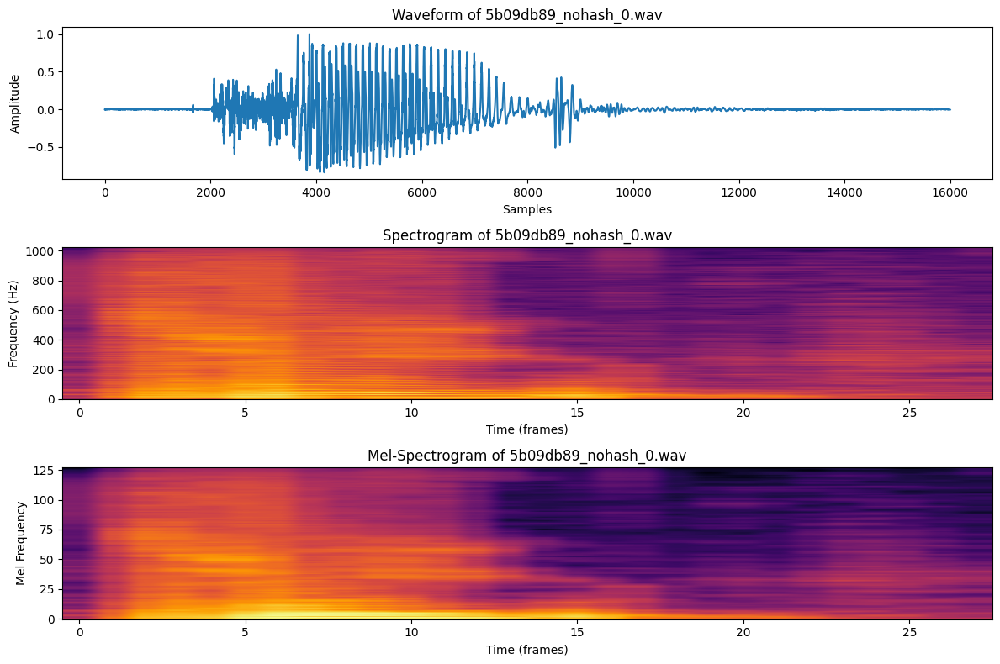

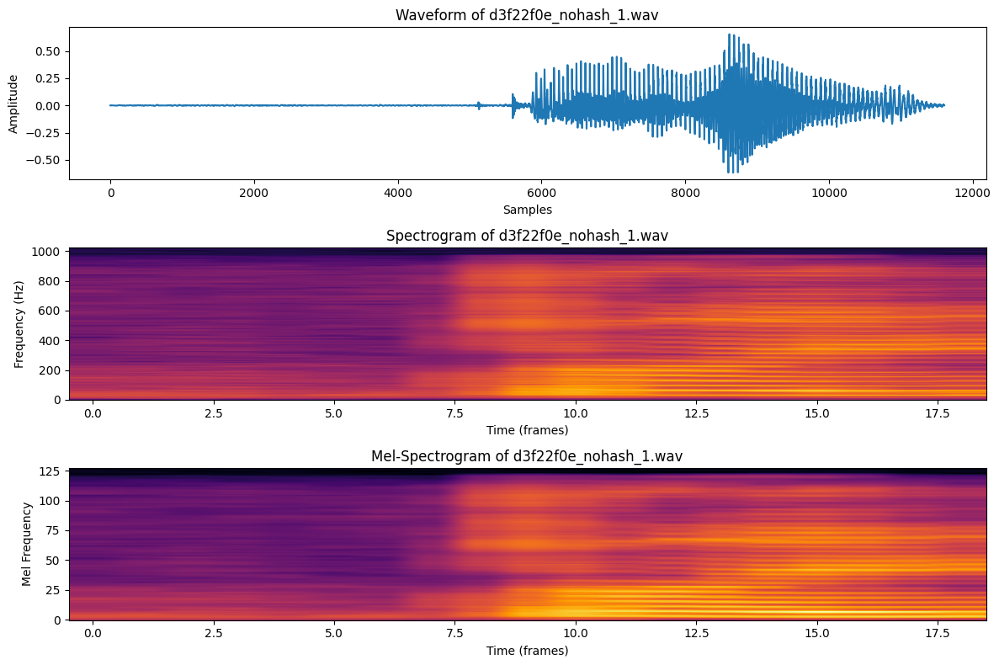

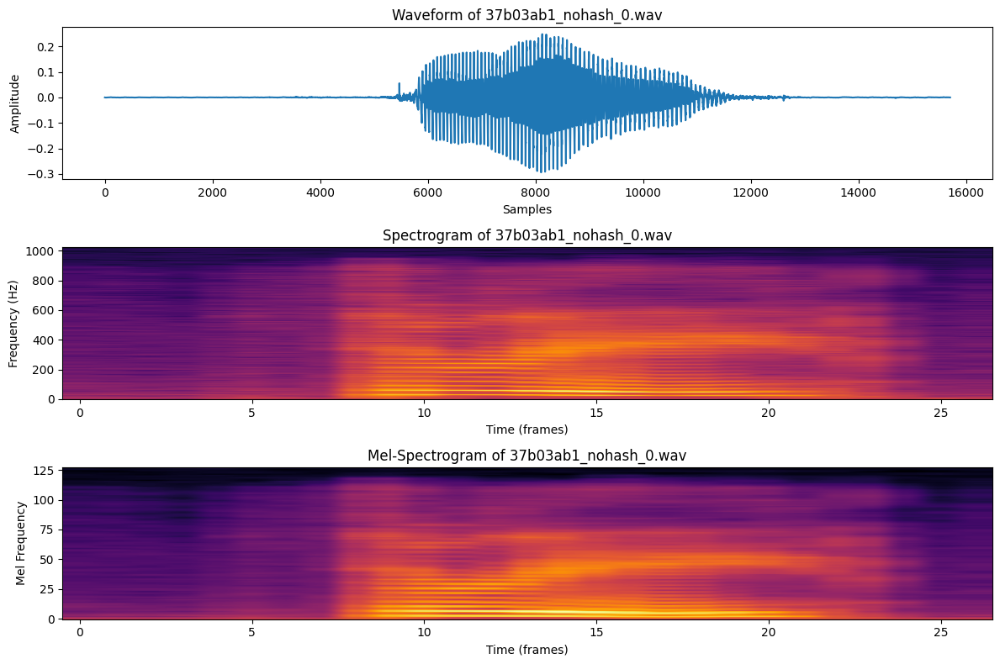

In [2]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import librosa

def compute_stft(audio, n_fft=2048, hop_length=512):
    
    stft = []
    for i in range(0, len(audio) - n_fft + 1, hop_length):
        windowed_audio = audio[i:i + n_fft] * np.hanning(n_fft)
        spectrum = np.fft.rfft(windowed_audio)
        stft.append(spectrum)
    return np.array(stft).T

def compute_mel_filterbank(sr, n_fft, n_mels=128):
    
    mel_points = np.linspace(0, sr // 2, n_mels + 2)  # Mel-spaced points
    fft_freqs = np.linspace(0, sr // 2, n_fft // 2 + 1)  # FFT frequencies
    mel_filters = np.zeros((n_mels, len(fft_freqs)))

    for i in range(1, len(mel_points) - 1):
        left = mel_points[i - 1]
        center = mel_points[i]
        right = mel_points[i + 1]

        left_slope = (fft_freqs - left) / (center - left)
        right_slope = (right - fft_freqs) / (right - center)

        mel_filters[i - 1] = np.maximum(0, np.minimum(left_slope, right_slope))

    return mel_filters

def compute_mel_spectrogram(stft, mel_filters):
    
    power_spectrogram = np.abs(stft) ** 2
    mel_spectrogram = np.dot(mel_filters, power_spectrogram)
    return mel_spectrogram


selected_classes = random.sample(list(audio_df['Class'].unique()), 3)

for cls in selected_classes:
    
    files = os.listdir(os.path.join(dataset_path, cls))
    selected_files = random.sample(files, 3)

    for file in selected_files:
        audio_path = os.path.join(dataset_path, cls, file)
        audio, sr = librosa.load(audio_path, sr=16000)

        
        if audio.size == 0:
            print(f"Warning: {file} is empty.")
            continue

        plt.figure(figsize=(12, 8))

        # Plot Waveform
        plt.subplot(3, 1, 1)
        plt.title(f'Waveform of {file}')
        plt.plot(audio)
        plt.xlabel('Samples')
        plt.ylabel('Amplitude')

        stft = compute_stft(audio)
        if stft.shape[0] == 0:
            print(f"Warning: STFT for {file} is empty.")
            continue
        
        D = 10 * np.log10(np.abs(stft) ** 2 + 1e-9)  
        
        plt.subplot(3, 1, 2)
        plt.title(f'Spectrogram of {file}')
        plt.imshow(D, aspect='auto', origin='lower', cmap='inferno')
        plt.xlabel('Time (frames)')
        plt.ylabel('Frequency (Hz)')

        # Mel filterbank and Mel-Spectrogram
        mel_filters = compute_mel_filterbank(sr, n_fft=2048)
        mel_spectrogram = compute_mel_spectrogram(stft, mel_filters)
        if mel_spectrogram.shape[0] == 0:
            print(f"Warning: Mel spectrogram for {file} is empty.")
            continue
        
        mel_dB = 10 * np.log10(mel_spectrogram + 1e-9)  

        # Plot Mel-Spectrogram
        plt.subplot(3, 1, 3)
        plt.title(f'Mel-Spectrogram of {file}')
        plt.imshow(mel_dB, aspect='auto', origin='lower', cmap='inferno')
        plt.xlabel('Time (frames)')
        plt.ylabel('Mel Frequency')

        plt.tight_layout()
        plt.show()


In [3]:
import os
import shutil # used to delete background noise directory
import random
import numpy as np
import librosa # used for loading
import soundfile as sf
import matplotlib.pyplot as plt

# dataset
dataset_path = 'audioDataset'


def detect_silence(audio, threshold=0.01):
    silent_indices = np.where(np.abs(audio) < threshold)[0]
    return silent_indices

def remove_silence(audio, silence_indices):
    return np.delete(audio, silence_indices)

# delete _background_noise_ directory 
background_noise_path = os.path.join(dataset_path, '_background_noise_')
if os.path.exists(background_noise_path):
    shutil.rmtree(background_noise_path)
    print(f"Deleted directory: {background_noise_path}")

# class counts 
class_counts = {class_folder: len(os.listdir(os.path.join(dataset_path, class_folder))) 
                for class_folder in os.listdir(dataset_path) 
                if os.path.isdir(os.path.join(dataset_path, class_folder))}

target = sum(class_counts.values())//35

print(f"Target number of files per class (max): {target}")

# remove silence
for class_folder in class_counts.keys():
    class_path = os.path.join(dataset_path, class_folder)
    files = os.listdir(class_path)

    for file in files:
        if file.endswith('.wav'):
            audio_path = os.path.join(class_path, file)
            audio, sr = librosa.load(audio_path, sr=16000)

            # silent treatment
            silent_segments = detect_silence(audio)
            if len(silent_segments) > 0:
                cleaned_audio = remove_silence(audio, silent_segments)
                
                # save
                sf.write(audio_path, cleaned_audio, sr)
                print(f"Processed {file} in class {class_folder}: Removed silent segments")

Deleted directory: audioDataset\_background_noise_
Target number of files per class (max): 3023
Processed 0165e0e8_nohash_0.wav in class backward: Removed silent segments
Processed 017c4098_nohash_0.wav in class backward: Removed silent segments
Processed 017c4098_nohash_1.wav in class backward: Removed silent segments
Processed 017c4098_nohash_2.wav in class backward: Removed silent segments
Processed 017c4098_nohash_3.wav in class backward: Removed silent segments
Processed 017c4098_nohash_4.wav in class backward: Removed silent segments
Processed 02ade946_nohash_0.wav in class backward: Removed silent segments
Processed 02ade946_nohash_1.wav in class backward: Removed silent segments
Processed 02ade946_nohash_2.wav in class backward: Removed silent segments
Processed 02ade946_nohash_3.wav in class backward: Removed silent segments
Processed 02ade946_nohash_4.wav in class backward: Removed silent segments
Processed 03401e93_nohash_0.wav in class backward: Removed silent segments
Proc

In [4]:
# avg num of files
target = sum(class_counts.values())//35

# balanced dataset 
for class_folder, count in class_counts.items():
    class_path = os.path.join(dataset_path, class_folder)

    if count < target:
        # Oversample
        files = os.listdir(class_path)
        files_to_copy = random.choices(files, k=target - count)  
        for file in files_to_copy:
            base, ext = os.path.splitext(file)
            new_file_name = f"copy_{random.randint(10000, 99999)}_{base}{ext}"
            shutil.copy(os.path.join(class_path, file), os.path.join(class_path, new_file_name))
            print(f"Oversampling: Copied {file} as {new_file_name} in class {class_folder}")

    elif count > target:
        # Undersample
        files = os.listdir(class_path)
        files_to_remove = random.sample(files, count - target) 
        for file in files_to_remove:
            os.remove(os.path.join(class_path, file))
            print(f"Undersampling: Removed {file} from class {class_folder}")

Oversampling: Copied a045368c_nohash_0.wav as copy_54463_a045368c_nohash_0.wav in class backward
Oversampling: Copied 322d17d3_nohash_1.wav as copy_19819_322d17d3_nohash_1.wav in class backward
Oversampling: Copied 9448c397_nohash_1.wav as copy_14493_9448c397_nohash_1.wav in class backward
Oversampling: Copied 81332c92_nohash_4.wav as copy_20347_81332c92_nohash_4.wav in class backward
Oversampling: Copied 51f7a034_nohash_4.wav as copy_59063_51f7a034_nohash_4.wav in class backward
Oversampling: Copied 1b627376_nohash_0.wav as copy_96000_1b627376_nohash_0.wav in class backward
Oversampling: Copied 39833acb_nohash_0.wav as copy_82624_39833acb_nohash_0.wav in class backward
Oversampling: Copied 6fb3d5a7_nohash_2.wav as copy_81017_6fb3d5a7_nohash_2.wav in class backward
Oversampling: Copied 72e382bd_nohash_3.wav as copy_86882_72e382bd_nohash_3.wav in class backward
Oversampling: Copied de3fe344_nohash_1.wav as copy_75256_de3fe344_nohash_1.wav in class backward
Oversampling: Copied 525eaa62_


Final class counts after balancing:
backward: 3023 files
bed: 3023 files
bird: 3023 files
cat: 3023 files
dog: 3023 files
down: 3023 files
eight: 3023 files
five: 3023 files
follow: 3023 files
forward: 3023 files
four: 3023 files
go: 3023 files
happy: 3023 files
house: 3023 files
learn: 3023 files
left: 3023 files
marvin: 3023 files
nine: 3023 files
no: 3023 files
off: 3023 files
on: 3023 files
one: 3023 files
right: 3023 files
seven: 3023 files
sheila: 3023 files
six: 3023 files
stop: 3023 files
three: 3023 files
tree: 3023 files
two: 3023 files
up: 3023 files
visual: 3023 files
wow: 3023 files
yes: 3023 files
zero: 3023 files

Final class counts after balancing:


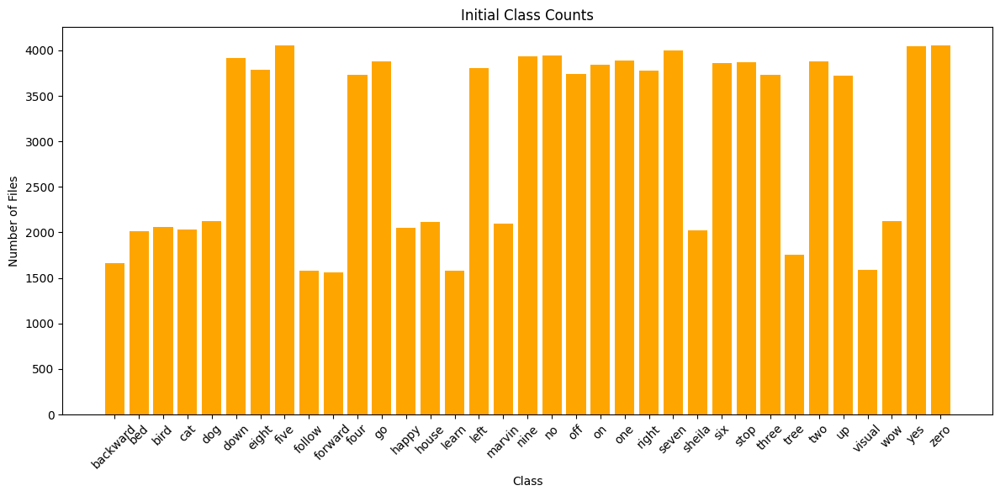

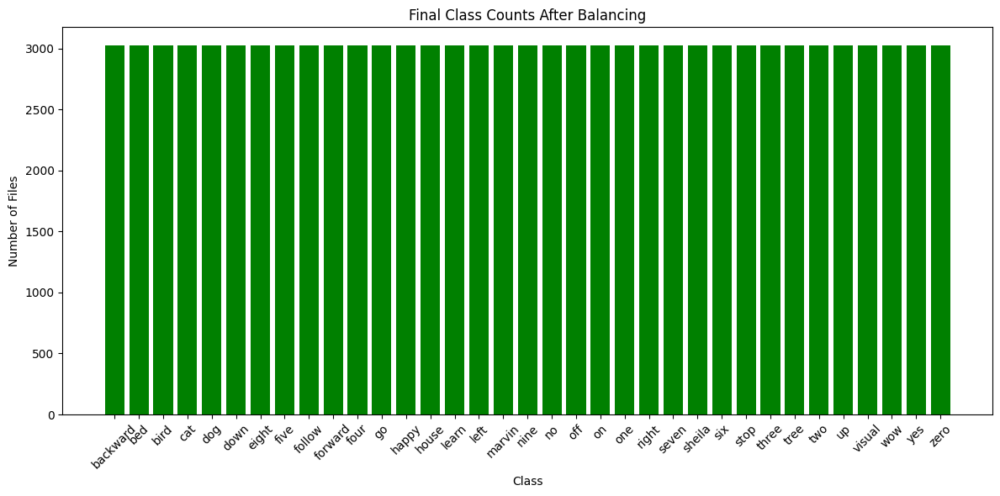

In [5]:
print("\nFinal class counts after balancing:")
final_class_counts = {class_folder: len(os.listdir(os.path.join(dataset_path, class_folder))) 
                      for class_folder in os.listdir(dataset_path) 
                      if os.path.isdir(os.path.join(dataset_path, class_folder))}
for cls, count in final_class_counts.items():
    print(f"{cls}: {count} files")
    
print("\nFinal class counts after balancing:")
final_class_counts = {class_folder: len(os.listdir(os.path.join(dataset_path, class_folder))) 
                      for class_folder in os.listdir(dataset_path) 
                      if os.path.isdir(os.path.join(dataset_path, class_folder))}

# Plotting the initial class counts
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color='orange')
plt.title('Initial Class Counts')
plt.xlabel('Class')
plt.ylabel('Number of Files')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plotting the final class counts
plt.figure(figsize=(12, 6))
plt.bar(final_class_counts.keys(), final_class_counts.values(), color='green')
plt.title('Final Class Counts After Balancing')
plt.xlabel('Class')
plt.ylabel('Number of Files')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [6]:
import librosa
import numpy as np
import os
import pandas as pd
from scipy.fftpack import dct

def extract_speech_features(y, sr):
    try:
        mfcc_features = calculate_mfcc(y, sr)
        spectral_contrast = cal_spectral_contrast(y, sr)
        zcr = cal_zero_crossing_rate(y)
        rms_energy = cal_rms_energy(y)
        spectral_centroid = cal_spectral_centroid(y, sr)
        spectral_rolloff = cal_spectral_rolloff(y, sr)
        
        
        feature_vector = np.concatenate([
            mfcc_features,
            spectral_contrast,
            zcr,
            rms_energy,
            spectral_centroid,
            spectral_rolloff
        ])
        
        return feature_vector
    except Exception as e:
        return None

def calculate_mfcc(y, sr, num_mfcc=13, n_mels=40, n_fft=2048, hop_length=512):
    stft_matrix = np.abs(st_fourier_transform(y, n_fft=n_fft, hop_length=hop_length))
    mel_fb = mel_filterbank(sr, n_fft, n_mels)
    mel_spec = np.dot(mel_fb, stft_matrix**2)
    log_mel_spec = np.log(mel_spec + 1e-9)
    mfcc = dct(log_mel_spec, type=2, axis=0, norm='ortho')[:num_mfcc]
    return np.mean(mfcc, axis=1)


def mel_filterbank(sr, n_fft, n_mels=40, fmin=0, fmax=None):
    fmax = fmax or sr // 2
    mel_min = hz_to_mel_convert(fmin)
    mel_max = hz_to_mel_convert(fmax)
    mel_points = np.linspace(mel_min, mel_max, n_mels + 2)
    hz_points = mel_to_hz_convert(mel_points)
    bin_f = hz_to_fft(hz_points, sr, n_fft)

    filterbank = np.zeros((n_mels, n_fft // 2 + 1))
    for m in range(1, n_mels + 1):
        f_m_minus = bin_f[m - 1]
        f_m = bin_f[m]
        f_m_plus = bin_f[m + 1]

        for k in range(f_m_minus, f_m):
            filterbank[m - 1, k] = (k - bin_f[m - 1]) / (bin_f[m] - bin_f[m - 1])
        for k in range(f_m, f_m_plus):
            filterbank[m - 1, k] = (bin_f[m + 1] - k) / (bin_f[m + 1] - bin_f[m])

    return filterbank

def hz_to_mel_convert(hz):
    return 2595 * np.log10(1 + hz / 700)

def mel_to_hz_convert(mel):
    return 700 * (10**(mel / 2595) - 1)

def hz_to_fft(freq, sr, n_fft):
    return np.floor((n_fft + 1) * freq / sr).astype(int)


def st_fourier_transform(y, n_fft=2048, hop_length=512, win_length=None, window='hann'):
    if win_length is None:
        win_length = n_fft
    if window == 'hann':
        window = np.hanning(win_length)
    y = np.pad(y, int(n_fft // 2), mode='reflect')
    frames = librosa.util.frame(y, frame_length=n_fft, hop_length=hop_length)
    windowed = frames * window[:, None]
    return np.fft.rfft(windowed, n_fft, axis=0)

def cal_spectral_contrast(y, sr):
    fft = np.abs(np.fft.fft(y))
    contrast = np.var(fft) 
    return np.array([contrast])

def cal_zero_crossing_rate(y):
    zero_crossings = np.sum(np.abs(np.diff(np.sign(y)))) / len(y)
    return np.array([zero_crossings])

def cal_rms_energy(y):
    rms = np.sqrt(np.mean(y**2))
    return np.array([rms])

def cal_spectral_centroid(y, sr):
    magnitudes = np.abs(np.fft.rfft(y))
    frequencies = np.linspace(0, sr / 2, len(magnitudes))
    centroid = np.sum(frequencies * magnitudes) / np.sum(magnitudes)
    return np.array([centroid])

def cal_spectral_rolloff(y, sr, rolloff_percent=0.85):
    magnitudes = np.abs(np.fft.rfft(y))
    cumulative_energy = np.cumsum(magnitudes)
    total_energy = cumulative_energy[-1]
    rolloff_point = np.where(cumulative_energy >= total_energy * rolloff_percent)[0][0]
    rolloff_frequency = rolloff_point * (sr / 2) / len(magnitudes)
    return np.array([rolloff_frequency])


def extract_features(data_path):
    all_classes = os.listdir(data_path)
    features_list = []
    for class_name in all_classes:
        class_path = os.path.join(data_path, class_name)
        files = os.listdir(class_path)
        for file in files:
            file_path = os.path.join(class_path, file)
            try:
                y, sr = librosa.load(file_path, sr=None)
                feature_vector = extract_speech_features(y, sr)
                if feature_vector is not None:
                    features_list.append([class_name] + feature_vector.tolist())
            except Exception as e:
                print(f"Error processing {file_path}: {e}")
        print(f'Finished extracting features for class: {class_name}')
    
    column_names = (
        ['Class'] + [f'MFCC_{i}' for i in range(1, 14)] +
        ['Spectral_Contrast', 'Zero_Crossing_Rate', 'RMS_Energy', 'Spectral_Centroid', 'Spectral_Rolloff']
    )
    features_df = pd.DataFrame(features_list, columns=column_names)
    return features_df


data_path = 'audioDataset'

features_df = extract_features(data_path)
features_df.to_csv('extracted_audio_features.csv', index=False)
print("Extracted features saved to 'extracted_audio_features.csv'.")

Finished extracting features for class: backward
Finished extracting features for class: bed
Finished extracting features for class: bird
Error extracting features: can't extend empty axis 0 using modes other than 'constant' or 'empty'
Finished extracting features for class: cat
Finished extracting features for class: dog
Finished extracting features for class: down
Finished extracting features for class: eight
Finished extracting features for class: five
Error extracting features: can't extend empty axis 0 using modes other than 'constant' or 'empty'
Error extracting features: can't extend empty axis 0 using modes other than 'constant' or 'empty'
Error extracting features: can't extend empty axis 0 using modes other than 'constant' or 'empty'
Finished extracting features for class: follow
Finished extracting features for class: forward
Finished extracting features for class: four
Finished extracting features for class: go
Finished extracting features for class: happy
Error extracting 

In [4]:
import pandas as pd
import numpy as np

df = pd.read_csv('extracted_audio_features.csv')

X = df.drop(columns=['Class']) 
y = df['Class']

def label_encode(y):

    unique_labels = np.unique(y)
    label_to_int = {label: idx for idx, label in enumerate(unique_labels)}
    y_encoded = np.array([label_to_int[label] for label in y])
    
    return y_encoded, label_to_int


y_encoded, label_mapping = label_encode(y)

print("First 5 encoded labels:", y_encoded[:5])
print("Label Mapping:", label_mapping)

print(f"Features shape: {X.shape}")
print(f"Target shape: {y_encoded.shape}")

First 5 encoded labels: [0 0 0 0 0]
Label Mapping: {'backward': 0, 'bed': 1, 'bird': 2, 'cat': 3, 'dog': 4, 'down': 5, 'eight': 6, 'five': 7, 'follow': 8, 'forward': 9, 'four': 10, 'go': 11, 'happy': 12, 'house': 13, 'learn': 14, 'left': 15, 'marvin': 16, 'nine': 17, 'no': 18, 'off': 19, 'on': 20, 'one': 21, 'right': 22, 'seven': 23, 'sheila': 24, 'six': 25, 'stop': 26, 'three': 27, 'tree': 28, 'two': 29, 'up': 30, 'visual': 31, 'wow': 32, 'yes': 33, 'zero': 34}
Features shape: (105796, 18)
Target shape: (105796,)


In [5]:
def standard_scaler(X):
    
    X_np = X.values
    means = np.mean(X_np, axis=0)
    std_devs = np.std(X_np, axis=0)
    X_scaled = (X_np - means) / std_devs
    
    return X_scaled

X_scaled = standard_scaler(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)
print(X_scaled_df.head())

     MFCC_1    MFCC_2    MFCC_3    MFCC_4    MFCC_5    MFCC_6    MFCC_7  \
0 -2.213484  1.049603  0.669073 -0.156894  1.677593  2.956699  1.523985   
1  0.932366  0.622746 -1.341604 -1.396729 -0.150117 -0.109090 -0.594244   
2  0.628105  0.443207 -1.321003 -1.206996 -0.456849 -0.119933  0.106501   
3  0.696108  0.721405 -1.371176 -1.271197 -0.103490 -0.422536 -0.788431   
4  0.810135  0.506050 -1.458835 -1.444239 -0.481185 -0.267519 -0.673402   

     MFCC_8    MFCC_9   MFCC_10   MFCC_11   MFCC_12   MFCC_13  \
0  1.390334  1.744427  1.748186  1.666769  1.339790  1.980225   
1  0.265598  0.919050  0.629482  0.815653 -0.020620  0.173996   
2  0.594987  1.138552  0.462794  0.470282  0.043936  0.310167   
3  0.227406  0.910479  0.441067  0.558012  0.084152  0.184783   
4 -0.124038  0.571531 -0.047526  0.167770  0.281071 -0.020389   

   Spectral_Contrast  Zero_Crossing_Rate  RMS_Energy  Spectral_Centroid  \
0           0.341867           -1.129082   -0.125291          -0.732627   
1       

In [6]:
np.random.seed(42)  
shuffled_indices = np.random.permutation(X_scaled_df.shape[0]) # shuffle

train_size = int(0.8 * len(shuffled_indices)) 

train_indices = shuffled_indices[:train_size]
test_indices = shuffled_indices[train_size:]

X_train_scaled = X_scaled_df.iloc[train_indices].values
X_test_scaled = X_scaled_df.iloc[test_indices].values
y_train = y_encoded[train_indices]
y_test = y_encoded[test_indices]

print("Training set shape:", X_train_scaled.shape)
print("y train shape:", y_train.shape)
print("y test shape:", y_test.shape)
print("Testing set shape:", X_test_scaled.shape)

# Accuracy Calculation
def calculate_accuracy(y_true, y_pred):
    return np.mean(y_true == y_pred)


Training set shape: (84636, 18)
y train shape: (84636,)
y test shape: (21160,)
Testing set shape: (21160, 18)


In [7]:
import numpy as np

def tree_entropy(y):
    unique_classes, class_counts = np.unique(y, return_counts=True)
    probabilities = class_counts / class_counts.sum()
    return -np.sum(probabilities * np.log2(probabilities + 1e-9))

def best_split(X, y, min_samples_split):
    best_feature, best_threshold, best_gain = None, None, -np.inf
    n_samples, n_features = X.shape
    parent_entropy = tree_entropy(y)
    
    for feature in range(n_features):
        threshold = np.mean(X[:, feature])
        
        left_idx = X[:, feature] <= threshold
        right_idx = X[:, feature] > threshold
        
        if len(y[left_idx]) < min_samples_split or len(y[right_idx]) < min_samples_split:
            continue
            
        left_entropy = tree_entropy(y[left_idx])
        right_entropy = tree_entropy(y[right_idx])
        n_left, n_right = len(y[left_idx]), len(y[right_idx])
        
        weighted_avg_entropy = (n_left * left_entropy + n_right * right_entropy) / n_samples
        information_gain = parent_entropy - weighted_avg_entropy
        
        if information_gain > best_gain:
            best_gain = information_gain
            best_feature = feature
            best_threshold = threshold
                
    return best_feature, best_threshold

def most_common_class(y):
    unique_classes, class_counts = np.unique(y, return_counts=True) 
    most_common_index = np.argmax(class_counts) 
    return unique_classes[most_common_index]

def build_tree(X, y, max_depth, min_samples_split, depth=0):
    if len(np.unique(y)) == 5 or depth == max_depth:
        return most_common_class(y)

    feature, threshold = best_split(X, y, min_samples_split)
    
    if feature is None:
        return most_common_class(y)

    left_idx = X[:, feature] <= threshold
    right_idx = X[:, feature] > threshold

    # min_smaple_split
    if len(y[left_idx]) < min_samples_split or len(y[right_idx]) < min_samples_split:
        return most_common_class(y)

    left_subtree = build_tree(X[left_idx], y[left_idx], max_depth, min_samples_split, depth + 1)
    right_subtree = build_tree(X[right_idx], y[right_idx], max_depth, min_samples_split, depth + 1)

    return {"feature": feature, "threshold": threshold, "left": left_subtree, "right": right_subtree}

def predict_tree(tree, x):
    if isinstance(tree, dict):
        feature, threshold = tree["feature"], tree["threshold"]
        if x[feature] <= threshold:
            return predict_tree(tree["left"], x)
        else:
            return predict_tree(tree["right"], x)
    return tree

def bootstrap_sample(X, y):
    n_samples = X.shape[0]
    indices = np.random.randint(0, n_samples, size=n_samples)
    X_sample = X[indices]
    y_sample = y[indices] 
    return X_sample, y_sample

def build_forest(X, y, n_estimators, max_depth, min_samples_split):
    trees = []
    for i in range(n_estimators):
        print("building tree", i)
        X_sample, y_sample = bootstrap_sample(X, y)
        tree = build_tree(X_sample, y_sample, max_depth, min_samples_split)
        trees.append(tree)
    return trees

def predict_forest(trees, X):
    predictions = []
    for x in X:
        tree_votes = [predict_tree(tree, x) for tree in trees] 
        final_prediction = most_common_class(tree_votes)
        predictions.append(final_prediction)
    return np.array(predictions)


In [14]:
n_estimators = 200
max_depth = 20
min_samples_split = 2
forest = build_forest(X_train_scaled, y_train, n_estimators, max_depth, min_samples_split)

building tree 0
building tree 1
building tree 2
building tree 3
building tree 4
building tree 5
building tree 6
building tree 7
building tree 8
building tree 9
building tree 10
building tree 11
building tree 12
building tree 13
building tree 14
building tree 15
building tree 16
building tree 17
building tree 18
building tree 19
building tree 20
building tree 21
building tree 22
building tree 23
building tree 24
building tree 25
building tree 26
building tree 27
building tree 28
building tree 29
building tree 30
building tree 31
building tree 32
building tree 33
building tree 34
building tree 35
building tree 36
building tree 37
building tree 38
building tree 39
building tree 40
building tree 41
building tree 42
building tree 43
building tree 44
building tree 45
building tree 46
building tree 47
building tree 48
building tree 49
building tree 50
building tree 51
building tree 52
building tree 53
building tree 54
building tree 55
building tree 56
building tree 57
building tree 58
buildin

In [15]:
y_pred = predict_forest(forest, X_test_scaled)
accuracy = calculate_accuracy(y_test, y_pred)
print(f"Accuracy = {accuracy*100}")

Accuracy = 52.48109640831758


In [16]:
n_estimators = 200
max_depth = 20
min_samples_split = 2
forest = build_forest(X_train_scaled, y_train, n_estimators, max_depth, min_samples_split)

building tree 0
building tree 1
building tree 2
building tree 3
building tree 4
building tree 5
building tree 6
building tree 7
building tree 8
building tree 9
building tree 10
building tree 11
building tree 12
building tree 13
building tree 14
building tree 15
building tree 16
building tree 17
building tree 18
building tree 19
building tree 20
building tree 21
building tree 22
building tree 23
building tree 24
building tree 25
building tree 26
building tree 27
building tree 28
building tree 29
building tree 30
building tree 31
building tree 32


KeyboardInterrupt: 

In [ ]:
y_pred = predict_forest(forest, X_test_scaled)
accuracy = calculate_accuracy(y_test, y_pred)
print(f"Accuracy = {accuracy*100}")

In [17]:
n_estimators = 200
max_depth = 20
min_samples_split = 5
forest = build_forest(X_train_scaled, y_train, n_estimators, max_depth, min_samples_split)
y_pred = predict_forest(forest, X_test_scaled)
accuracy = calculate_accuracy(y_test, y_pred)
print(f"Accuracy = {accuracy*100}")

building tree 0
building tree 1
building tree 2
building tree 3
building tree 4
building tree 5
building tree 6
building tree 7
building tree 8
building tree 9
building tree 10
building tree 11
building tree 12
building tree 13
building tree 14
building tree 15
building tree 16
building tree 17
building tree 18
building tree 19
building tree 20
building tree 21
building tree 22
building tree 23
building tree 24
building tree 25
building tree 26
building tree 27
building tree 28
building tree 29
building tree 30
building tree 31
building tree 32
building tree 33
building tree 34
building tree 35
building tree 36
building tree 37
building tree 38
building tree 39
building tree 40
building tree 41
building tree 42
building tree 43
building tree 44
building tree 45
building tree 46
building tree 47
building tree 48
building tree 49
building tree 50
building tree 51
building tree 52
building tree 53
building tree 54
building tree 55
building tree 56
building tree 57
building tree 58
buildin

In [18]:
n_estimators = 200
max_depth = 25
min_samples_split = 2
forest = build_forest(X_train_scaled, y_train, n_estimators, max_depth, min_samples_split)
y_pred = predict_forest(forest, X_test_scaled)
accuracy = calculate_accuracy(y_test, y_pred)
print(f"Accuracy = {accuracy*100}")

building tree 0
building tree 1
building tree 2
building tree 3
building tree 4
building tree 5
building tree 6
building tree 7
building tree 8
building tree 9
building tree 10
building tree 11
building tree 12
building tree 13
building tree 14
building tree 15
building tree 16
building tree 17
building tree 18
building tree 19
building tree 20
building tree 21
building tree 22
building tree 23
building tree 24
building tree 25
building tree 26
building tree 27
building tree 28
building tree 29
building tree 30
building tree 31
building tree 32
building tree 33
building tree 34
building tree 35
building tree 36
building tree 37
building tree 38
building tree 39
building tree 40
building tree 41
building tree 42
building tree 43
building tree 44
building tree 45
building tree 46
building tree 47
building tree 48
building tree 49
building tree 50
building tree 51
building tree 52
building tree 53
building tree 54
building tree 55
building tree 56
building tree 57
building tree 58
buildin

In [ ]:
import pickle

n_estimators = 200
max_depth = 25
min_samples_split = 2

forest = build_forest(X_train_scaled, y_train, n_estimators, max_depth, min_samples_split)

# Save 
with open('random_forest_model.pkl', 'wb') as file:
    pickle.dump(forest, file)



building tree 0
building tree 1
building tree 2
building tree 3


KeyboardInterrupt: 

In [10]:
# Load 
with open('random_forest_model.pkl', 'rb') as file:
    loaded_forest = pickle.load(file)

y_pred = predict_forest(loaded_forest, X_test_scaled)
accuracy = calculate_accuracy(y_test, y_pred)
print(f"Accuracy = {accuracy * 100:.2f}%")


Accuracy = 52.86%


In [6]:
def gaussian_pdf(x, mean, var):
    noise = 1e-9 
    coefficient = 1 / np.sqrt(2 * np.pi * var + noise)
    exponent = np.exp(- (x - mean) ** 2 / (2 * var + noise))
    return coefficient * exponent

def calculate_prior(y):
    classes, counts = np.unique(y, return_counts=True)
    total_samples = len(y)
    priors = counts / total_samples 
    return dict(zip(classes, priors))

def calculate_mean_variance(X, y):
    means = {}
    variances = {}
    classes = np.unique(y)
    
    for cls in classes:
        X_class = X[y == cls]  
        means[cls] = np.mean(X_class, axis=0) 
        variances[cls] = np.var(X_class, axis=0)  
        
    return means, variances

def calculate_posterior(X, means, variances, priors):
    posteriors = []
    classes = priors.keys()
    
    for cls in classes:
        prior = np.log(priors[cls])  
        conditional = 0 
        
        for i in range(len(means[cls])):
            prob = gaussian_pdf(X[i], means[cls][i], variances[cls][i])
            conditional += np.log(prob + 1e-9) 
        
        posterior = prior + conditional
        posteriors.append(posterior)
    
    return np.argmax(posteriors)  

def train(X, y):
    priors = calculate_prior(y)  
    means, variances = calculate_mean_variance(X, y) 
    return priors, means, variances

def predict_nb(X, priors, means, variances):
    predictions = []
    for x in X:
        predicted_class = calculate_posterior(x, means, variances, priors)
        predictions.append(predicted_class)
    return np.array(predictions)


In [ ]:
priors, means, variances = train(X_train_scaled, y_train)

model = {'priors': priors, 'means': means, 'variances': variances}
with open('naive_bayes_model_audio.pkl', 'wb') as file:
    pickle.dump(model, file)

In [ ]:

with open('naive_bayes_model_audio.pkl', 'rb') as file:
    loaded_model = pickle.load(file)

y_pred = predict_nb(X_test_scaled, loaded_model['priors'], loaded_model['means'], loaded_model['variances'])

accuracy = calculate_accuracy(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 26.78%
